In [1]:
import numpy as np
import pandas as pd
import keras
import keras.utils
from keras.utils.np_utils import to_categorical
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
import re
import string
from nltk.tokenize import word_tokenize
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
np.random.seed(0)
import torch
import torch.nn as nn
from torch import optim
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, precision_recall_fscore_support

In [2]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\patri\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\patri\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

# Task 2: Emoji prediction (Classification task)

#### The dataset consists of crawled tweets from Twitter. Every tweet is labeled with a class corresponding to the emoji the user put after the text of the tweet. Your task is to predict the emoji from a given tweet. This exercise represents a typical application of a classification task. As with the regression task, report all your preprocessing steps and mind their importance. The dataset consists of a separate training and testing dataset. Report your performance, including overall accuracy, precision and recall for all classes and the micro and macro average for precision and recall, on the test dataset!

#### Hint: The train and test datasets are pickle files (.pkl). Use the function pandas.read_pickle(path) to read the files into a pandas data frame.

In [3]:
#from google.colab import files
#dataset_file_dict = files.upload()

In [4]:
df_train = pd.read_pickle("C:/Users/patri/Desktop/Informatik/Knowledge Discovery and Data Mining 1/emoji/emoji_train.pkl")      # Shape: (42627, 4)
df_test = pd.read_pickle("C:/Users/patri/Desktop/Informatik/Knowledge Discovery and Data Mining 1/emoji/emoji_test.pkl")        # (10657, 4)
df_test

,tweet,emoji_class,emoji,predicted_class
0,Lmao. My #Bitmoji is so perfect. Looks and act...,1,😂,None
1,I like to call this the #tandem because we dec...,0,❤,None
2,Crab dip French toast! Yum! I Miss Shirley's! ...,0,❤,None
3,Happy Thanksgiving from my family to yours! ️ ...,0,❤,None
4,#familynight ️ @ Soho House West Hollywood \n,0,❤,None
...,...,...,...,...
10652,Overshine by the sunlight ️ - Golden gate brid...,6,☀,None
10653,Those one handed interception drills coming in...,3,🔥,None
10654,Can I get a for this good looking group? We're...,0,❤,None
10655,"w/ @user : @user with the shots @ Manhattan, N...",2,📸,None


In [5]:
print(len(df_train))
classes = df_train.groupby('emoji_class')
print(classes.describe())

42627
             tweet                                                            \
             count unique                                                top   
emoji_class                                                                    
0            16846  16791                     ️ @ Los Angeles, California \n   
1             7801   7784                       @ Los Angeles, California \n   
2             6103   6080                 @user @ Los Angeles, California \n   
3             4884   4868                       @ Los Angeles, California \n   
4             2450   2437  #FlockCity flockcityla // Fresh Cut High Quali...   
5             2431   2425  ALL wknd apply Code: VEGAS and receive 15% off...   
6             2112   2107                     ️ @ Los Angeles, California \n   

                  emoji                   predicted_class                   
            freq  count unique top   freq           count unique  top freq  
emoji_class                            

In [6]:
# plt.bar(['0', '1', '2', '3', '4', '5', '6'], height=[
#                                                      df_train['emoji_class'].value_counts()[0],
#                                                      df_train['emoji_class'].value_counts()[1],
#                                                      df_train['emoji_class'].value_counts()[2],
#                                                      df_train['emoji_class'].value_counts()[3],
#                                                      df_train['emoji_class'].value_counts()[4],
#                                                      df_train['emoji_class'].value_counts()[5],
#                                                      df_train['emoji_class'].value_counts()[6]] , color='crbgy')
# plt.title("Data Distribution")
# plt.show()

## Data Preprocessing

In [7]:
df_train.isnull().values.any()

True

In [8]:
df_train.isnull().values

array([[False, False, False,  True],
       [False, False, False,  True],
       [False, False, False,  True],
       ...,
       [False, False, False,  True],
       [False, False, False,  True],
       [False, False, False,  True]])

In [9]:
# last column in df_train is null - we remove it
# we drop also emoji column - we don't need it
df_train = df_train.drop(columns = ["predicted_class", "emoji"])

In [10]:
df_train.isnull().values.any()

False

<AxesSubplot:>

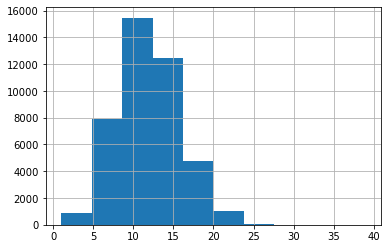

In [11]:
#check the distribution
df_train['tweet'].str.split().map(lambda x: len(x)).hist()

## Text Pre-Processing

This is rather a simple cleaning pipeline:

Remove special characters and leave only letters.
Lowercase all letters and split the text
Remove emojis/links/usernames and normalize hash tags.
Apply stemming on the data to fix the influence of the bad words
Remove all the stopwords as they are do not contain a lot of information stored.
Create a sequence again
We also make use of Stemming as we believe this might be a factor that influence the learning of the model

Reference: Code implementation for the paper "DeepHate: Hate Speech Detection via

In [12]:
def expand_match(contraction):
    contraction_mapping = {
        "isn't": "is not",
        "aren't": "are not",
        "con't": "cannot",
        "can't've": "cannot have",
        "you'll've": "your will have",
        "you're": "you are",
        "you've": "you have"
    }
    match = contraction.group(0)
    first_char = match[0]
    expanded_contraction = contraction_mapping.get(match) \
        if contraction_mapping.get(match) \
        else contraction_mapping.get(match.lower())
    expanded_contraction = first_char + expanded_contraction[1:]
    return expanded_contraction

In [13]:
def clean_tweets(text, stem_flag = False):
    url_pattern = re.compile(r'(https?:\/\/(?:www\.|(?!www))[a-zA-Z0-9][a-zA-Z0-9-]+[a-zA-Z0-9]\.[^\s]{2,}|https?:\/\/(?:www\.|(?!www))'r'[a-zA-Z0-9]\.[^\s]{2,}|www\.[a-zA-Z0-9]\.[^\s]{2,})')
    emojis_pattern = re.compile(u'([\U00002600-\U000027BF])|([\U0001f300-\U0001f64F])|([\U0001f680-\U0001f6FF])')
    hash_pattern = re.compile(r'#\w*')
    single_letter_pattern = re.compile(r'(?<![\w\-])\w(?![\w\-])')
    blank_spaces_pattern = re.compile(r'\s{2,}|\t')
    reserved_pattern = re.compile(r'(RT|rt|FAV|fav|VIA|via)')
    mention_pattern = re.compile(r'@\w*')
    CONTRACTION_MAP = {
        "isn't": "is not",
        "aren't": "are not",
        "con't": "cannot",
        "can't've": "cannot have",
        "you'll've": "your will have",
        "you're": "you are",
        "you've": "you have"
    }
    constraction_pattern = re.compile('({})'.format('|'.join(CONTRACTION_MAP.keys())),
                                        flags=re.IGNORECASE | re.DOTALL)
    Whitespace = re.compile(u"[\s\u0020\u00a0\u1680\u180e\u202f\u205f\u3000\u2000-\u200a]+", re.UNICODE)
    urls = re.sub(pattern=url_pattern, repl='', string=text)
    mentions = re.sub(pattern=mention_pattern, repl='', string=urls)
    hashtag = re.sub(pattern=hash_pattern, repl='', string=mentions)
    reserved = re.sub(pattern=reserved_pattern, repl='', string=hashtag)
    reserved = Whitespace.sub(" ", reserved)
    reserved = constraction_pattern.sub(expand_match, reserved)
    punct = "[{}]+".format(string.punctuation)
    punctuation = re.sub(punct, '', reserved)
    single = re.sub(pattern=single_letter_pattern, repl='', string=punctuation)
    blank = re.sub(pattern=blank_spaces_pattern, repl=' ', string=single)
    blank = blank.lower()
    if stem_flag:
        stemming = re.sub(r'/(ies|y|ed|ing|s)(\s|\b)/g', ' ', blank)

    return blank.split() if not stem_flag else stemming.split()

In [14]:
def tweet_processing(raw_tweet):
    words = clean_tweets(raw_tweet)
    stops = set(stopwords.words("english"))
    m_w = [w for w in words if not w in stops]
    return (" ".join(m_w))

In [15]:
# Clean tweets
num_tweets = df_train["tweet"].size
clean_tweet = []
for i in range(0,num_tweets):
    clean_tweet.append(tweet_processing(df_train["tweet"][i]))
df_train["tweet"] = clean_tweet 

df_train

KeyboardInterrupt: 

## Data Preparation

Let's make the data ready for training. We need to:

tokenize the sequence in words and assign each word in the vocabulary an index so we can relate it later on.
pad the vectorized sequence to have fixed unit

In [ ]:
df_train['tokenized_sents'] = df_train.apply(lambda column: word_tokenize(column['tweet']), axis=1)


In [ ]:
def process_data(data, max_len=40):
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(data['tokenized_sents'])
    sequences = tokenizer.texts_to_sequences(data['tokenized_sents'])
    # Pad the sequence in order to have max length...
    x = pad_sequences(sequences, maxlen=max_len)
    # Make one hot encoding for labeling part. Should be in input [1 0]
    y = to_categorical(data['emoji_class'], num_classes=7)
    # splitting the Dataset into Train and Test set
    x_train, x_test, y_train, y_test=train_test_split(x,y,test_size=0.2,random_state=0, shuffle=False)
    return x_train, x_test, y_train, y_test

In [ ]:
#x_train, x_validation, y_train, y_validation = process_data(df_train)
x_train, X_test, y_train_arr, y_test = process_data(df_train)
print(x_train, y_train_arr)

[[   0    0    0 ...  541  102 7145]
 [   0    0    0 ...    2 5358  163]
 [   0    0    0 ...    2  950  407]
 ...
 [   0    0    0 ...  190    7 2051]
 [   0    0    0 ...    3    2    6]
 [   0    0    0 ...  469  245   88]] [[0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 1. 0. ... 0. 0. 0.]]


In [ ]:
# n_classes = df_train['emoji_class'].max()
# print("Number of Classes:", n_classes)

In [ ]:
# X_train = df_train['tweet'].values              # (42627,)
# X_test = df_test['tweet'].values                # (10657,)
# y_train = df_train['emoji_class'].values        # (42627,)
# y_test = df_test['emoji_class'].values          # (10657,)

## Convert Array to Torch Tensor

In [ ]:
X_train = torch.from_numpy(x_train)    	    # encode the words as some indices similar to the Lang class in the Seq2Seq Tutorial
y_train = torch.from_numpy(y_train_arr)         # Shape 1D
X_test = torch.from_numpy(X_test)
y_test = torch.from_numpy(y_test)           # Shape 1D 
#print("y_train:", y_train.shape, "y_test:", y_test.shape)

In [ ]:
# y_train = []

# for i in range(len(y_train_pre)):
#     if 1 in y_train_pre[i,0]:
#         y_train.append(0)
#     if 1 in y_train_pre[i,1]:
#         y_train.append(1)
#     if 1 in y_train_pre[i,2]:
#         y_train.append(2)
#     if 1 in y_train_pre[i,3]:
#         y_train.append(3)
#     if 1 in y_train_pre[i,4]:
#         y_train.append(4)
#     if 1 in y_train_pre[i,5]:
#         y_train.append(5)
#     if 1 in y_train_pre[i,6]:
#         y_train.append(6)

In [ ]:
len(y_train)
y_train = torch.Tensor(y_train)
print(type(y_train))

<class 'torch.Tensor'>


In [ ]:
#X_train = X_train.unsqueeze(dim=1)

In [ ]:
print(X_train.shape, type(X_train), y_train.shape, type(y_train))

torch.Size([34101, 40]) <class 'torch.Tensor'> torch.Size([34101, 7]) <class 'torch.Tensor'>


## Model

### Can select between different models, Deep Neural Network, SVM, 

In [ ]:
## Input 3 Channels two classes, can be changed 
class ConvModel(nn.Module):
    def __init__(self):
        super(ConvModel, self).__init__()
        self.conv1 = nn.Sequential(
                    nn.Conv1d(in_channels=1, out_channels=64, kernel_size=3, padding=1),
                    nn.ReLU(),
                    nn.MaxPool1d(3, stride=2),
                    nn.Conv1d(in_channels=64, out_channels=96, kernel_size=3, padding=1),
                    nn.ReLU(),
                    nn.MaxPool1d(3, stride=2),
                    nn.Conv1d(in_channels=96, out_channels=128, kernel_size=3, padding=1),
                    nn.ReLU(),
                    nn.MaxPool1d(3, stride=2),
                    nn.Conv1d(in_channels=128, out_channels=32, kernel_size=3, padding=1),
                    nn.ReLU(),
                    nn.MaxPool1d(3, stride=2)
                    )       

    def forward(self,x):
        x= self.conv1(x)
        x= x.view(x.size(0), -1)            # Flattening
        return x

In [ ]:
## Input 3 Channels two classes, can be changed 
class ConvModel2(nn.Module):
    def __init__(self):
        super(ConvModel2, self).__init__()
        self.conv1 = nn.Sequential(
                    nn.Conv1d(in_channels=40, out_channels=86, kernel_size=3, padding=1),
                    nn.ReLU(),
                    nn.MaxPool1d(3, stride=2),
                    nn.Conv1d(in_channels=86, out_channels=128, kernel_size=3, padding=1),
                    nn.ReLU(),
                    nn.MaxPool1d(3, stride=2),
                    nn.Conv1d(in_channels=128, out_channels=164, kernel_size=3, padding=1),
                    nn.ReLU(),
                    nn.MaxPool1d(3, stride=2),
                    nn.Conv1d(in_channels=164, out_channels=7, kernel_size=3, padding=1),
                    nn.ReLU(),
                    nn.MaxPool1d(3, stride=2)
                    )       

    def forward(self,x):
        x= self.conv1(x)
        x= x.view(x.size(0), -1)            # Flattening
        return x

In [ ]:
# guter test 
class MLP_V2_2(nn.Module):
    def __init__(self):
        super().__init__()
        self.hidden = nn.Linear(34101, 1000)
        #self.hidden2 = nn.Linear(80, 32)
        self.output = nn.Linear(1000, 7)
        #self.relu = nn.ReLU()
        #self.sigmoid = nn.Sigmoid()
        
    def forward(self, x):
        x = self.hidden(x)
        #x = self.sigmoid(x)
        #x = self.hidden2(x)
        #x = self.relu(x)
        x = self.output(x)
        return x

In [ ]:
class TinyModel(torch.nn.Module):

    def __init__(self):
        super(TinyModel, self).__init__()

        self.linear1 = torch.nn.Linear(34101, 200)
        self.activation = torch.nn.ReLU()
        self.linear2 = torch.nn.Linear(200, 1)
        self.softmax = torch.nn.Softmax()

    def forward(self, x):
        x = self.linear1(x)
        x = self.activation(x)
        x = self.linear2(x)
        x = self.softmax(x)
        return x

In [ ]:
class Net(nn.Module):
  def __init__(self):
    super(Net, self).__init__()
    self.hid1 = nn.Linear(40, 10)  # 6-(10-10)-3
    self.hid2 = nn.Linear(10, 10)
    self.oupt = nn.Linear(10, 7)

    nn.init.xavier_uniform_(self.hid1.weight)
    nn.init.zeros_(self.hid1.bias)
    nn.init.xavier_uniform_(self.hid2.weight)
    nn.init.zeros_(self.hid2.bias)
    nn.init.xavier_uniform_(self.oupt.weight)
    nn.init.zeros_(self.oupt.bias)


  def forward(self, x):
    z = torch.tanh(self.hid1(x))
    z = torch.tanh(self.hid2(z))
    z = self.oupt(z)  # no softmax: CrossEntropyLoss() 
    return z

In [ ]:
class Net1(nn.Module):
    def __init__(self,D_in,H,D_out):
        super(Net1,self).__init__()
        self.linear1=nn.Linear(D_in,H)
        self.linear2=nn.Linear(H,D_out)

        
    def forward(self,x):
        x=torch.sigmoid(self.linear1(x))  
        x=self.linear2(x)
        return x

## Training

### Choose different loss (BCE, MSE, CrossEntropy loss, Choose different schedular

In [ ]:
def train(model, optimizer, X_train, train_y, max_epoch):

  train_loss = []
  train_acc = []
  y_target =[]

  # Divide the learning rate by 2 at each epoch, as suggested in paper
  scheduler = optim.lr_scheduler.StepLR(optimizer, 1, gamma=0.5, last_epoch=-1)     # Decays the learning rate of each parameter group by gamma every step_size epochs. 
  #                                                                                   Notice that such decay can happen simultaneously with other changes to the learning rate from outside this scheduler.
  #                                                                                   When last_epoch = -1, sets initial lr as lr.
  epoch = 0                                                                         # Epochs done so far
  stop = False   
  correct=0
  total=0
  #loss_func=torch.nn.BCELoss()                                                                   # Status to know when to stop
  #loss_func = nn.CrossEntropyLoss()
  #loss_func = nn.SmoothL1Loss()
  loss_func =  nn.MSELoss()


  while epoch < max_epoch and not stop:                   
    running_loss = 0.0
    running_acc = 0.0

    optimizer.zero_grad()                                                          # Sets the gradients of all optimized torch.Tensors to zero

    yhat = model(X_train.float())                     # input x and predict based on 
    #print(yhat)
    yhat = yhat.squeeze()
    #train_y = train_y.to(torch.float)
    #print(train_y.shape, train_y)
    #yhat = yhat.to(torch.float)
    #yhat =yhat.double()
    #yhat = torch.tensor(yhat, dtype=torch.long)
    #train_y.type(torch.LongTensor)
    #loss = loss_func(yhat, train_y.long())           # must be (1. nn output, 2. target), the target label is NOT one-hotted
   #print(yhat, train_y)


    # print(yhat.shape, train_y.shape)
    # print(yhat)
    loss = loss_func(yhat, train_y)
    #loss = loss.to(torch.float32)
    loss.backward()                           # backward pass
    optimizer.step()                          # gradient descent; Performs a single optimization step (parameter update)                                                                               
      
    #Print the statistic
    running_loss += loss                                                
    #running_acc += loss


    epoch_loss = running_loss
    epoch_acc = running_acc

    #_, predicted = yhat.max(1)
    #total += y_train.size(0)
    #correct += predicted.eq(y_train).sum().item()
       
    #train_loss=running_loss/len(trainloader)
    #accu=100.*correct/total
   
    #print("Accuracy = {}".format(accu))
    print('Epoch {:d} -- Loss: {:.4f} '.format(epoch+1,epoch_loss))
    #print('Epoch {:d} -- Loss: {:.4f} Acc: {:.4f}'.format(epoch+1,epoch_loss, epoch_acc))
    epoch += 1
    scheduler.step()                                                                 # This change the learning rate at each epoch, otherwise the LR would stays at the initial value                                             
    train_loss.append(loss)
    #train_acc= np.append(train_acc,epoch_acc)
    #y_target.append(target_inds)

  return train_loss, train_acc 

In [ ]:
input_dim= 40        # how many Variables are in the dataset
hidden_dim = 25    # hidden layers
output_dim = 7      # number of classes

model1=Net1(input_dim,hidden_dim,output_dim)

In [ ]:
#model = ConvModel()
#model = ConvModel2()
#model = MLP_V2_2()
#model = TinyModel()
#model = Net()
#model = Net1()

max_epoch = 1000

#optimizer = torch.optim.Adam(model.parameters(), lr=0.001,weight_decay=5e-4) #  L2 regularization
#optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
#optimizer = torch.optim.Adam(model1.parameters(), lr=0.001)     # gut bis 2.7
optimizer = torch.optim.SGD(model1.parameters(), lr = 0.001)   # sehr schlecht
#train_loss, train_acc = train(model, optimizer, X_train, y_train, max_epoch)
train_loss, train_acc = train(model1, optimizer, X_train, y_train, max_epoch)

Epoch 1 -- Loss: 0.3797 
Epoch 2 -- Loss: 0.3784 
Epoch 3 -- Loss: 0.3778 
Epoch 4 -- Loss: 0.3774 
Epoch 5 -- Loss: 0.3773 
Epoch 6 -- Loss: 0.3772 
Epoch 7 -- Loss: 0.3771 
Epoch 8 -- Loss: 0.3771 
Epoch 9 -- Loss: 0.3771 
Epoch 10 -- Loss: 0.3771 
Epoch 11 -- Loss: 0.3771 
Epoch 12 -- Loss: 0.3771 
Epoch 13 -- Loss: 0.3771 
Epoch 14 -- Loss: 0.3771 
Epoch 15 -- Loss: 0.3771 
Epoch 16 -- Loss: 0.3771 
Epoch 17 -- Loss: 0.3771 
Epoch 18 -- Loss: 0.3771 
Epoch 19 -- Loss: 0.3771 
Epoch 20 -- Loss: 0.3771 
Epoch 21 -- Loss: 0.3771 
Epoch 22 -- Loss: 0.3771 
Epoch 23 -- Loss: 0.3771 
Epoch 24 -- Loss: 0.3771 
Epoch 25 -- Loss: 0.3771 
Epoch 26 -- Loss: 0.3771 
Epoch 27 -- Loss: 0.3771 
Epoch 28 -- Loss: 0.3771 
Epoch 29 -- Loss: 0.3771 
Epoch 30 -- Loss: 0.3771 
Epoch 31 -- Loss: 0.3771 
Epoch 32 -- Loss: 0.3771 
Epoch 33 -- Loss: 0.3771 
Epoch 34 -- Loss: 0.3771 
Epoch 35 -- Loss: 0.3771 
Epoch 36 -- Loss: 0.3771 
Epoch 37 -- Loss: 0.3771 
Epoch 38 -- Loss: 0.3771 
Epoch 39 -- Loss: 0.3

In [ ]:
input_dim= 40       # how many Variables are in the dataset
hidden_dim = 4      # hidden layers
output_dim = 7      # number of classes

model=Net1(input_dim,hidden_dim,output_dim)

In [ ]:
print('W:',list(model.parameters())[0].size())
print('b',list(model.parameters())[1].size())

W: torch.Size([4, 40])
b torch.Size([4])


In [ ]:
criterion=nn.CrossEntropyLoss()

In [ ]:
#learning_rate=0.001
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
#optimizer=torch.optim.SGD(model.parameters(), lr=learning_rate)

In [ ]:
from torch.utils.data import Dataset, DataLoader
class Data(Dataset):
    def __init__(self):
        self.x=torch.from_numpy(x_train)
        self.y=torch.from_numpy(y_train_arr)
        self.len=self.x.shape[0]
    def __getitem__(self,index):      
        return self.x[index], self.y[index]
    def __len__(self):
        return self.len

In [ ]:
data_set=Data()

In [ ]:
trainloader=DataLoader(dataset=data_set,batch_size=64)

In [ ]:
n_epochs=1000
loss_list=[]

#n_epochs
for epoch in range(n_epochs):
    for x, y in trainloader:
    #    x= X_train
     #   y =y_train

        #clear gradient 
        optimizer.zero_grad()
        #make a prediction 
        z=model(x.to(torch.float))
        # calculate loss, da Cross Entropy benutzt wird muss ich in den loss Klassen vorhersagen, 
        # also Wahrscheinlichkeit pro Klasse. Das mach torch.max(y,1)[1])
        loss=criterion(z,y)
        # calculate gradients of parameters 
        loss.backward()
        # update parameters 
        optimizer.step()
        
        loss_list.append(loss.data)
        
        
        print('epoch {}, loss {}'.format(epoch, loss.item()))

epoch 0, loss 2.1890604496002197
epoch 0, loss 2.203533172607422
epoch 0, loss 2.0908877849578857
epoch 0, loss 2.0732474327087402
epoch 0, loss 2.2299232482910156
epoch 0, loss 2.1726012229919434
epoch 0, loss 2.112536907196045
epoch 0, loss 2.030841112136841
epoch 0, loss 2.0989537239074707
epoch 0, loss 2.1220903396606445
epoch 0, loss 2.198992967605591
epoch 0, loss 2.1406002044677734
epoch 0, loss 2.159470558166504
epoch 0, loss 2.2514090538024902
epoch 0, loss 2.046086311340332
epoch 0, loss 2.074378490447998
epoch 0, loss 2.1263957023620605
epoch 0, loss 2.187009811401367
epoch 0, loss 2.121260404586792
epoch 0, loss 2.1377744674682617
epoch 0, loss 2.0818850994110107
epoch 0, loss 2.089379072189331
epoch 0, loss 2.196525812149048
epoch 0, loss 1.892020583152771
epoch 0, loss 2.1129822731018066
epoch 0, loss 2.152313709259033
epoch 0, loss 2.107328176498413
epoch 0, loss 2.132521390914917
epoch 0, loss 2.0878098011016846
epoch 0, loss 2.0352704524993896
epoch 0, loss 2.094039678

KeyboardInterrupt: 

## Testing

In [ ]:
def test(model, test_x, test_y, test_episode):
  target_test =[]
  pred_test =[]

  running_loss = 0.0
  running_acc = 0.0
  for episode in tnrange(test_episode):                                                  

    ypred = model(X_test)
    running_loss += output['loss']
    running_acc += output['acc']
    target_test.append(target_inds)
    pred_test.append(y_hat)
    
  avg_loss = running_loss / test_episode
  avg_acc = running_acc / test_episode
  #print('Test results -- Loss: {:.4f} Acc: {:.4f}'.format(avg_loss, avg_acc))
  
  return avg_loss, avg_acc, y_target, y_pred

In [ ]:
test_episode = 1000

test_loss, test_acct, y_target, y_pred =test(model, X_test, y_test, test_episode)


In [ ]:
print( "True set of labels in training:", y_target)
print("Predicted set of labels in training:", y_pred)
print( "True set of labels in test:", y_target_test)
print( "Predicted set of labels in test:", y_pred_test)

## Evaluation on Performance Metrics

In [ ]:
plt.rc('text', usetex=True)             # use LaTeX fonts in the plot
plt.rc('font', family='serif')
sns.set_theme(style="darkgrid")

### Train Loss

In [ ]:
plt.plot(train_loss, label='loss')
plt.xlabel('Epoch')
plt.ylabel('Loss [Anomaly]')
plt.legend()
plt.grid(True)

### Train Accuracy


In [ ]:
train_acc = accuracy_score(y_target_test, y_pred_test)
plt.plot(train_acc, label='accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy [Anomaly]')
plt.legend()
plt.grid(True)

In [ ]:
a_score = accuracy_score(y_target_test, y_pred_test)
print(a_score)

### F1-Score & Precision & Recall

In [ ]:
f1 = f1_score( y_target_test,y_pred_test, pos_label=1)
precision = precision_score( y_target_test,y_pred_test)
recall = recall_score( y_target_test,y_pred_test)

### Confusion Matrix

In [ ]:
def compute_cm(y_target_test, y_pred_test):         
    cm = confusion_matrix(y_pred_test, y_target_test)
    cm = cm.tolist()
    cm_dict = {'class'+str(count): cm[count] for count in range(len(cm))}
    return cm, cm_dict


cm = confusion_matrix( y_target_test,y_pred_test)
group_names = ['True Neg','False Pos','False Neg','True Pos']
categories = ['Negativ(0)','Positiv(1)']
group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in cm.flatten()/np.sum(cm)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cm, annot=labels, fmt='', cmap="icefire_r")

## Results

In [ ]:
print(" Accuracy:", format(test_acc, ".3f"))
print(" Loss:", format(test_loss, ".3f"))
print(" F1 Score: %.3f" % f1)
print(" Precision :", format(precision, ".3f"))
print(" Recall:", format(recall, ".1f"))

## Save to Dataframe

In [ ]:
df = pd.DataFrame({'Train Loss': train_loss,
                   'Train Accuracy': train_acc,
                   'Test Loss': test_loss,
                   'Test Accuracy': test_acc,
                   'F1-Score': f1,
                   'Precision': precision,
                   'Recall': recall,
                   })
                   
df_label = pd.DataFrame({ 'y_pred_test': y_pred_test,
                           'y_target_test': y_target_test
                    })


pd.DataFrame(df).to_csv("/Users/PFR1UL/Desktop/.csv", index = False)
pd.DataFrame(df_label).to_csv("/Users/PFR1UL/Desktop/.csv", index = False)
